In [5]:
import urllib.request

url = 'https://opendata-ajuntament.barcelona.cat/data/api/action/datastore_search?resource_id=857fe9dd-8d84-49be-9646-a304467e8c45'
fileobj = urllib.request.urlopen(url)
print(fileobj.read())

b'{"help": "https://opendata-ajuntament.barcelona.cat/data/api/3/action/help_show?name=datastore_search", "success": true, "result": {"resource_id": "857fe9dd-8d84-49be-9646-a304467e8c45", "fields": [{"type": "int4", "id": "_id"}, {"type": "text", "id": "TRAM"}, {"type": "text", "id": "Rang"}, {"type": "text", "id": "GEOM_WKT"}], "records": [{"TRAM": "T04719W", "Rang": "30 - 40 \\u00b5g/m\\u00b3", "_id": 1, "GEOM_WKT": "MULTILINESTRING ((430229.788593716 4586585.19905775,430181.876584091 4586593.70443592))"}, {"TRAM": "T19941Z", "Rang": "30 - 40 \\u00b5g/m\\u00b3", "_id": 2, "GEOM_WKT": "MULTILINESTRING ((432928.898296899 4584019.98762825,432994.983965867 4583963.09304168))"}, {"TRAM": "T18111R", "Rang": "30 - 40 \\u00b5g/m\\u00b3", "_id": 3, "GEOM_WKT": "MULTILINESTRING ((429953.263102905 4588161.44067207,429981.418243399 4588174.24947826,430025.298476374 4588196.06217914))"}, {"TRAM": "T03222Y", "Rang": "30 - 40 \\u00b5g/m\\u00b3", "_id": 4, "GEOM_WKT": "MULTILINESTRING ((427949.0382

In [8]:
for i in fileobj.readlines():
    print(i)

In [6]:
from libpysal import weights, examples
from contextily import add_basemap
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import geopandas

# read in example data from a geopackage file. Geopackages
# are a format for storing geographic data that is backed
# by sqlite. geopandas reads data relying on the fiona package,
# providing a high-level pandas-style interface to geographic data.
map_gpkg = geopandas.read_file("data/2019_tramer_pm2-5_mapa_qualitat_aire_bcn.gpkg")
map_gpkg

,TRAM,Rang,geometry
0,T04719W,15 - 20 µg/m³,"MULTILINESTRING ((430229.789 4586585.199, 4301..."
1,T19941Z,15 - 20 µg/m³,"MULTILINESTRING ((432928.898 4584019.988, 4329..."
2,T18111R,15 - 20 µg/m³,"MULTILINESTRING ((429953.263 4588161.441, 4299..."
3,T03222Y,10 - 15 µg/m³,"MULTILINESTRING ((427949.038 4580946.043, 4279..."
4,T17625I,20 - 25 µg/m³,"MULTILINESTRING ((433950.189 4585741.214, 4338..."
...,...,...,...
15036,T17103N,10 - 15 µg/m³,"MULTILINESTRING ((428029.879 4581292.346, 4281..."
15037,T07428A,10 - 15 µg/m³,"MULTILINESTRING ((427903.283 4582223.115, 4278..."
15038,T02455J,10 - 15 µg/m³,"MULTILINESTRING ((428305.440 4581748.228, 4283..."
15039,T08868Y,15 - 20 µg/m³,"MULTILINESTRING ((431756.999 4585026.456, 4317..."


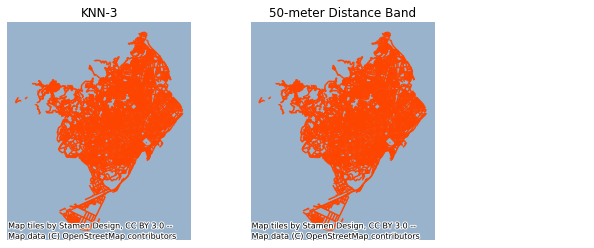

In [29]:

# construct the array of coordinates for the centroid
#coordinates = np.column_stack((map_gpkg.geometry.x, map_gpkg.geometry.y))

# construct two different kinds of graphs:

## 3-nearest neighbor graph, meaning that points are connected
## to the three closest other points. This means every point
## will have exactly three neighbors.
knn3 = weights.KNN.from_dataframe(map_gpkg, k=3)

## The 50-meter distance band graph will connect all pairs of points
## that are within 50 meters from one another. This means that points
## may have different numbers of neighbors.
#dist = weights.DistanceBand.from_array(coordinates, threshold=50)

# Then, we can convert the graph to networkx object using the
# .to_networkx() method.
knn_graph = knn3.to_networkx()
#dist_graph = dist.to_networkx()

# To plot with networkx, we need to merge the nodes back to
# their positions in order to plot in networkx
#positions = dict(zip(knn_graph.nodes, coordinates))

# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(8, 4))
for i, facet in enumerate(ax):
    cases.plot(marker=".", color="orangered", ax=facet)
    add_basemap(facet)
    facet.set_title(("KNN-3", "50-meter Distance Band")[i])
    facet.axis("off")
nx.draw(knn_graph, ax=ax[0], node_size=5, node_color="b")
#nx.draw(dist_graph, positions, ax=ax[1], node_size=5, node_color="b")
plt.show()

In [149]:
import pandas as pd
trams = pd.read_csv('data/BCN_GrafVial_CSV/BCN_GrafVial_Trams_ETRS89_CSV.csv',sep=';', encoding='latin-1')
trams

,FID,COORD_X,COORD_Y,LONGITUD,ANGLE,C_Tram,C_Nus_I,C_Nus_F,Distric_D,NDistric_D,...,TVia_D,NVia_D,Tram_Dret,Distric_E,NDistric_E,Illa_E,CVia_E,TVia_E,NVia_E,Tram_Esq
0,0,432128.893,4581047.606,42.615,15.04,T00001B,N00001D,N00002E,1,Ciutat Vella,...,Carrer,Carrer Pepe Rubianes,2,1,Ciutat Vella,10410,10900,Carrer,Carrer Pepe Rubianes,1
1,1,432156.649,4581054.946,14.806,14.20,T00002C,N00002E,N00003F,1,Ciutat Vella,...,Carrer,Carrer Pepe Rubianes,4 <=> 6,1,Ciutat Vella,10421,10900,Carrer,Carrer Pepe Rubianes,3 <=> 5
2,2,432171.171,4581059.200,15.480,18.40,T00003D,N00003F,N00004G,1,Ciutat Vella,...,Carrer,Carrer Pepe Rubianes,4 <=> 6,1,Ciutat Vella,10421,10900,Carrer,Carrer Pepe Rubianes,3 <=> 5
3,3,432185.863,4581063.068,14.969,10.98,T00004E,N00004G,N00005H,1,Ciutat Vella,...,Carrer,Carrer Pepe Rubianes,8 <=> 8 Z,1,Ciutat Vella,10441,10900,Carrer,Carrer Pepe Rubianes,7 <=> 9
4,4,432200.396,4581066.659,15.010,16.80,T00005F,N00005H,N00006I,1,Ciutat Vella,...,Carrer,Carrer Pepe Rubianes,10,1,Ciutat Vella,10441,10900,Carrer,Carrer Pepe Rubianes,7 <=> 9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14826,14826,426840.231,4583372.122,37.131,306.71,T21653T,N07106N,N10755R,5,Sarrià-Sant Gervasi,...,Via,Via Augusta,313,5,Sarrià-Sant Gervasi,34491,28000,Via,Via Augusta,313
14827,14827,426952.780,4583228.384,133.414,312.34,T21654U,N10463I,N10519H,5,Sarrià-Sant Gervasi,...,Carrer,Carrer Cardenal Sentmenat,2 - 6,5,Sarrià-Sant Gervasi,34421,65301,Carrer,Carrer Cardenal Sentmenat,1 - 5
14828,14828,433594.464,4583025.419,119.651,314.89,T21656W,N11406D,N08604E,10,Sant Martí,...,Carrer,Carrer Llacuna,2,10,Sant Martí,5989,183603,Carrer,Carrer Llacuna,1
14829,14829,433492.108,4582841.885,404.104,45.14,T21657X,N08591Q,N11406D,10,Sant Martí,...,,,0,10,Sant Martí,5989,700662,Carrer,Carrer Salvador Espriu,97 <=> 99 - 109


In [150]:
trams.columns

Index(['FID', 'COORD_X', 'COORD_Y', 'LONGITUD', 'ANGLE', 'C_Tram', 'C_Nus_I',
       'C_Nus_F', 'Distric_D', 'NDistric_D', 'Illa_D', 'CVia_D', 'TVia_D',
       'NVia_D', 'Tram_Dret', 'Distric_E', 'NDistric_E', 'Illa_E', 'CVia_E',
       'TVia_E', 'NVia_E', 'Tram_Esq'],
      dtype='object')

In [151]:
edges=trams[['C_Nus_I', 'C_Nus_F', 'C_Tram']]

In [152]:
nodes = pd.read_csv('data/BCN_GrafVial_CSV/BCN_GrafVial_Nodes_ETRS89_CSV.csv',sep=';', encoding='latin-1')
nodes

,FID,C_Nus,Coord_X,Coord_Y
0,0,N00001D,432108.315,4581042.075
1,1,N00002E,432149.471,4581053.136
2,2,N00003F,432163.827,4581056.757
3,3,N00004G,432178.516,4581061.643
4,4,N00005H,432193.211,4581064.493
...,...,...,...,...
9478,9478,N11401Y,433387.919,4587623.588
9479,9479,N11402Z,431415.815,4583657.085
9480,9480,N11403A,431348.814,4587348.949
9481,9481,N11404B,431402.856,4587314.296


In [153]:
coords = list(zip(nodes.Coord_X,nodes.Coord_Y))
positions = dict(zip(nodes.FID, coords))
positions[0]

(432108.315, 4581042.075)

In [154]:
nodes_id = nodes[['FID', 'C_Nus']]

In [155]:
edges = edges.merge(nodes_id, left_on='C_Nus_I', right_on='C_Nus')
edges = edges.merge(nodes_id, left_on='C_Nus_F', right_on='C_Nus')
edges = edges.merge(map_gpkg, left_on='C_Tram', right_on='TRAM')
edges

,C_Nus_I,C_Nus_F,C_Tram,FID_x,C_Nus_x,FID_y,C_Nus_y,TRAM,Rang,geometry
0,N00001D,N00002E,T00001B,0,N00001D,1,N00002E,T00001B,15 - 20 µg/m³,"MULTILINESTRING ((432108.315 4581042.075, 4321..."
1,N00056S,N00002E,T00169Y,54,N00056S,1,N00002E,T00169Y,15 - 20 µg/m³,"MULTILINESTRING ((432124.615 4581139.722, 4321..."
2,N00001D,N00017L,T17850P,0,N00001D,16,N00017L,T17850P,15 - 20 µg/m³,"MULTILINESTRING ((432108.315 4581042.075, 4321..."
3,N00002E,N00003F,T00002C,1,N00002E,2,N00003F,T00002C,15 - 20 µg/m³,"MULTILINESTRING ((432149.471 4581053.136, 4321..."
4,N09688C,N00003F,T15609A,8189,N09688C,2,N00003F,T15609A,15 - 20 µg/m³,"MULTILINESTRING ((432159.059 4581073.649, 4321..."
...,...,...,...,...,...,...,...,...,...,...
14679,N03629T,N10739R,T21567W,3182,N03629T,8972,N10739R,T21567W,10 - 15 µg/m³,"MULTILINESTRING ((426564.575 4586401.810, 4265..."
14680,N11375N,N11376O,T21569Y,9459,N11375N,9460,N11376O,T21569Y,15 - 20 µg/m³,"MULTILINESTRING ((428665.471 4586982.387, 4286..."
14681,N11378Q,N11376O,T21572T,9462,N11378Q,9460,N11376O,T21572T,15 - 20 µg/m³,"MULTILINESTRING ((428670.554 4586888.548, 4286..."
14682,N11380K,N11047A,T21580T,9464,N11380K,9209,N11047A,T21580T,10 - 15 µg/m³,"MULTILINESTRING ((428839.806 4587589.206, 4288..."


In [156]:
edges = edges[['FID_x', 'FID_y', 'Rang']]
print(edges.Rang.unique())
edges

['15 - 20 µg/m³' '10 - 15 µg/m³' '> 25 µg/m³' '20 - 25 µg/m³']


,FID_x,FID_y,Rang
0,0,1,15 - 20 µg/m³
1,54,1,15 - 20 µg/m³
2,0,16,15 - 20 µg/m³
3,1,2,15 - 20 µg/m³
4,8189,2,15 - 20 µg/m³
...,...,...,...
14679,3182,8972,10 - 15 µg/m³
14680,9459,9460,15 - 20 µg/m³
14681,9462,9460,15 - 20 µg/m³
14682,9464,9209,10 - 15 µg/m³


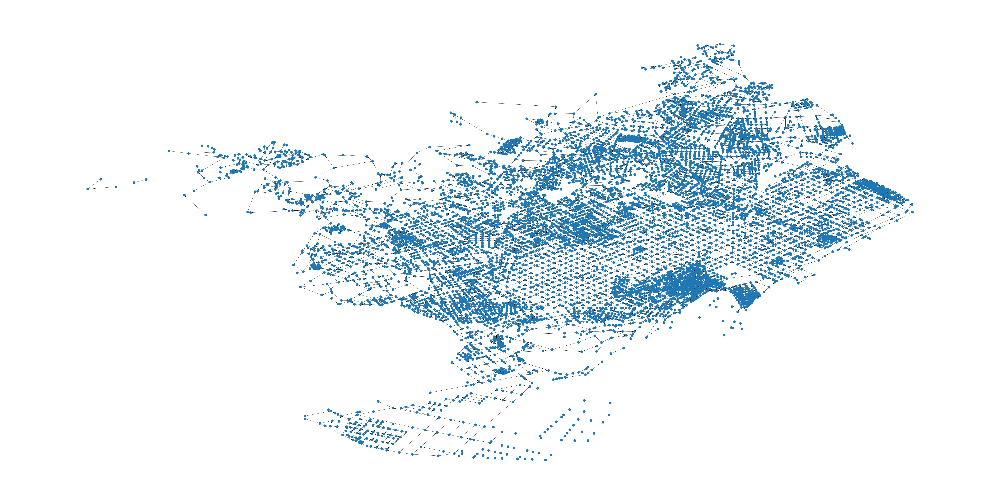

In [121]:
import torch
import dgl

u, v = torch.tensor(edges.FID_x), torch.tensor(edges.FID_y)
g = dgl.graph((u, v))

G = dgl.to_networkx(g)
plt.figure(figsize=[100,50])
nx.draw(G, pos=positions)

In [127]:
g.edges()
len(g.edges()[0])

14684

In [126]:
bg = dgl.add_reverse_edges(g)
len(bg.edges()[0])

29368

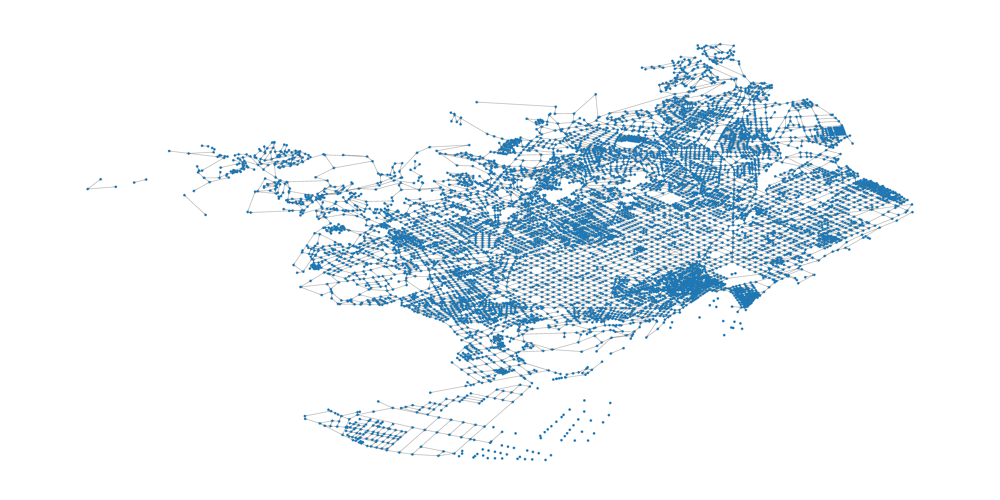

In [128]:
BG = dgl.to_networkx(bg)
plt.figure(figsize=[100,50])
nx.draw(BG, pos=positions)

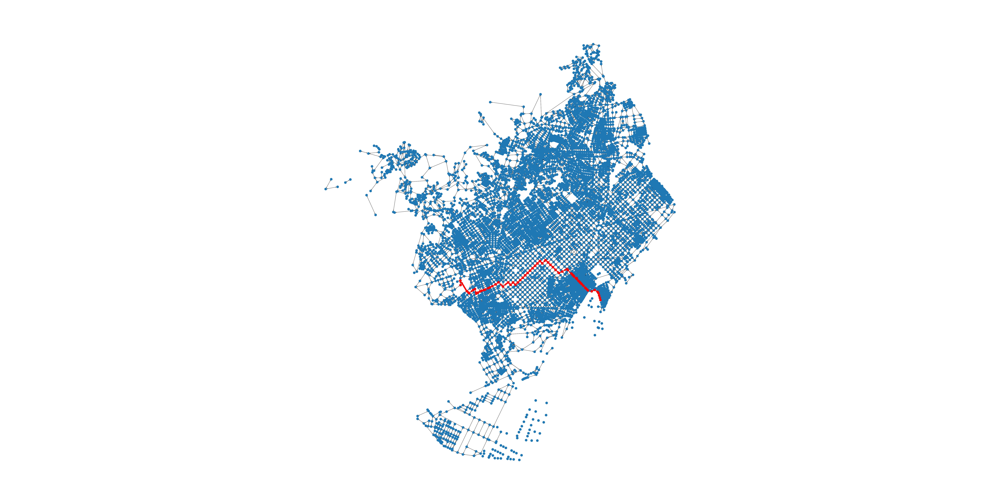

In [144]:
import networkx as nx
path = nx.bidirectional_shortest_path(BG, 0, 4000)
path_edges = list(zip(path,path[1:]))
plt.figure(figsize=[100,50])
nx.draw(BG, pos=positions)
nx.draw_networkx_nodes(BG,positions,nodelist=path,node_color='r')
nx.draw_networkx_edges(BG,positions,edgelist=path_edges,edge_color='r',width=10)
#plt.axis('equal')
plt.show()

## Weighted graph 

In [157]:
edges = edges[['FID_x', 'FID_y', 'Rang']]
edges.Rang = edges.Rang.map({'15 - 20 µg/m³':15, '10 - 15 µg/m³':10, '> 25 µg/m³':25, '20 - 25 µg/m³':20})
edges

,FID_x,FID_y,Rang
0,0,1,15
1,54,1,15
2,0,16,15
3,1,2,15
4,8189,2,15
...,...,...,...
14679,3182,8972,10
14680,9459,9460,15
14681,9462,9460,15
14682,9464,9209,10


In [160]:
u, v = torch.tensor(edges.FID_x), torch.tensor(edges.FID_y)
w =  torch.tensor(edges.Rang )
g = dgl.graph((u, v))
edges.data['weight']
G = dgl.to_networkx(g)

ValueError: too many values to unpack (expected 2)

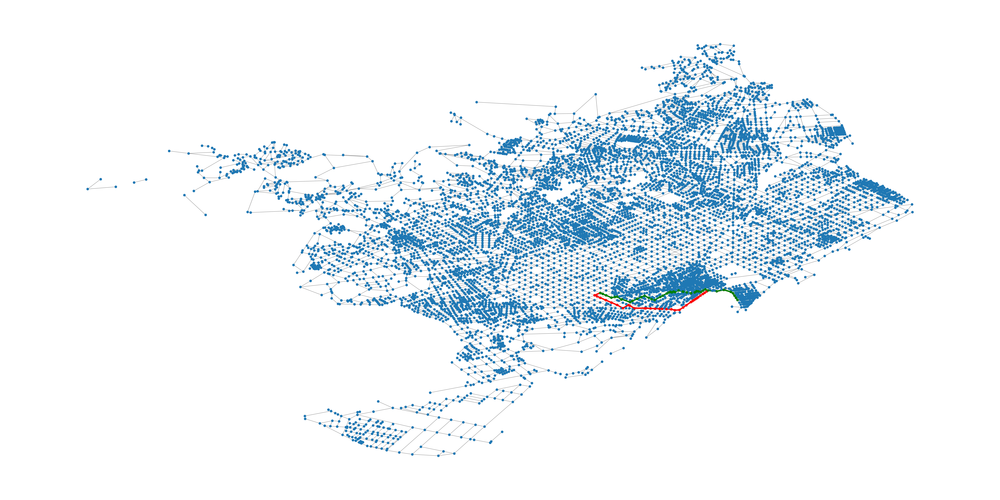

In [176]:
G = nx.Graph()

for i, edge in edges.iterrows():
    G.add_edge(edge['FID_x'], edge['FID_y'], weight=edge['Rang'])
    

path_w = nx.shortest_path(G,0,1000, 'weight')
path = nx.shortest_path(G,0,1000)

path_edges = list(zip(path,path[1:]))
path_edges_w = list(zip(path_w,path_w[1:]))


plt.figure(figsize=[100,50])
nx.draw(G, pos=positions)
nx.draw_networkx_nodes(G,positions,nodelist=path,node_color='r')
nx.draw_networkx_edges(G,positions,edgelist=path_edges,edge_color='r',width=10)

nx.draw_networkx_nodes(G,positions,nodelist=path_w,node_color='g')
nx.draw_networkx_edges(G,positions,edgelist=path_edges_w,edge_color='g',width=10)

plt.show()

In [130]:
source = 100
bg.ndata['x'] = torch.zeros(g.num_nodes())
bg.ndata['x'][:] = 1000000    # very big number
bg.ndata['x'][source] = 0
for _ in range(graph_diameter):
    g.update_all(fn.u_add_e('x', 'distance', 'm'), fn.min('m', 'x'))

NameError: name 'source' is not defined